In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import sigfig

from qPCR_plotting import *

df = pd.read_json('qpcr_df_05_KOP230P.json')
df['line_sample'] = df['line'] + '_' + df['sample'].astype(str)
dfq = df.query('line_sample == "KORH1_4"')
print(len(dfq.index))
df.query('line_sample == "KORH1_3"')

0


,gene,line,mean_relative_concentration,std_relative_concentration,sample,plate,Normalized relative concentration (Actin1),Expression fold change to KOP230P (normalised to Actin1),line_sample
221,AMA1,KORH1,1.373493,0.103491,3,1,0.110015,0.369746,KORH1_3
230,EBA140,KORH1,0.187006,0.014288,3,1,0.014979,0.054554,KORH1_3
239,EBA165,KORH1,0.162139,0.001079,3,1,0.012987,0.221512,KORH1_3
248,EBA175,KORH1,2.408115,0.047613,3,1,0.192886,0.331219,KORH1_3
257,EBA181,KORH1,0.462982,0.020038,3,1,0.037084,0.393624,KORH1_3
266,Pfcyp87,KORH1,0.028033,0.001979,3,1,0.002245,1.384952,KORH1_3
275,RH1,KORH1,0.094804,0.002968,3,2,0.011888,0.173750,KORH1_3
284,RH2a,KORH1,0.436929,0.030064,3,2,0.054790,1.114777,KORH1_3
293,RH2b,KORH1,0.231838,0.008270,3,2,0.029072,0.862178,KORH1_3
302,RH3,KORH1,0.486700,0.003106,3,2,0.061031,0.685462,KORH1_3


In [5]:
# Pivot the table
reshaped_df = df.pivot_table(
    index=['line_sample', 'line'],
    columns='gene',
    values=['Normalized relative concentration (Actin1)']
).reset_index()

# Flatten the MultiIndex and create new column names
# reshaped_df.columns = ['_'.join(col[::-1]).strip() if len(col[-1]) else col[0] for col in reshaped_df.columns.values]
reshaped_df.columns = [col[1] if col[1] else col[0] for col in reshaped_df.columns.values]

# Reset the index of reshaped DataFrame
reshaped_df.reset_index(drop=True, inplace=True)

reshaped_df

,line_sample,line,AMA1,EBA140,EBA165,EBA175,EBA181,Pfcyp87,RH1,RH2a,RH2b,RH3,RH4,RH5
0,KOEBA140_1,KOEBA140,0.777303,0.003949,0.125422,0.919681,0.257659,0.013469,0.000292,0.005065,0.020482,0.024513,0.000079,0.127372
1,KOEBA140_2,KOEBA140,0.176888,0.002844,0.034442,0.104332,0.089518,0.009416,0.000872,0.037315,0.030714,0.039254,0.002815,0.063473
2,KOEBA140_3,KOEBA140,0.175902,0.000522,0.029196,1.030124,0.090194,0.003928,0.229783,0.120186,0.053406,0.057127,0.068659,0.081086
3,KOEBA175_1,KOEBA175,0.675202,0.080517,0.122014,0.006746,0.135724,0.034833,0.004457,0.014326,0.030761,0.018858,0.000516,0.184923
4,KOEBA175_2,KOEBA175,0.101393,0.062379,0.025330,0.001154,0.034052,0.031193,0.008198,0.033828,0.038245,0.020828,0.004808,0.056398
5,KOEBA175_3,KOEBA175,0.127638,0.023795,0.065888,0.008689,0.051496,0.017410,0.796375,0.078459,0.156204,0.046283,0.042437,0.102815
6,KOEBA181_1,KOEBA181,0.418825,0.133761,0.109312,0.888393,0.002439,0.004836,0.002946,0.035997,0.037725,0.087847,0.001267,0.213255
7,KOEBA181_2,KOEBA181,0.176531,0.115407,0.030407,0.233673,0.001109,0.008796,0.003965,0.025746,0.019388,0.043762,0.003974,0.040643
8,KOEBA181_3,KOEBA181,0.172987,0.023816,0.038748,0.433412,0.000752,0.004844,0.171899,0.065254,0.066869,0.062894,0.034175,0.073059
9,KOP230P_1,KOP230P,0.305088,0.260409,0.042634,0.442310,0.129448,0.007173,0.042640,0.044962,0.036597,0.045718,0.020330,0.077968


66


,gene A,gene B,r2,rmse
0,AMA1,EBA140,0.000684,0.124024
1,AMA1,EBA165,0.615446,0.020338
2,AMA1,EBA175,0.043722,0.316061
3,AMA1,EBA181,0.442366,0.046929
4,AMA1,Pfcyp87,0.182419,0.008239
...,...,...,...,...
61,RH2b,RH4,0.170944,0.014969
62,RH2b,RH5,0.031010,0.050839
63,RH3,RH4,0.001298,0.016429
64,RH3,RH5,0.007518,0.051452


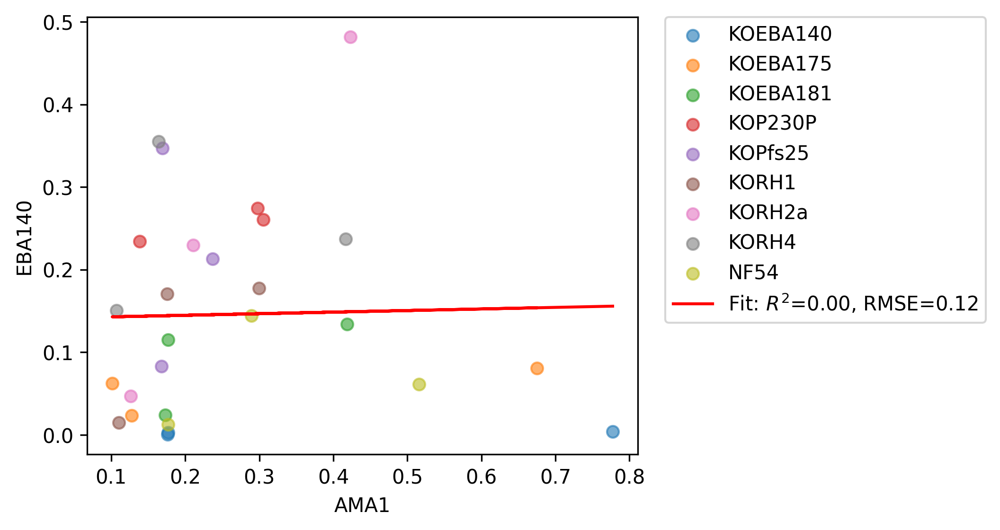

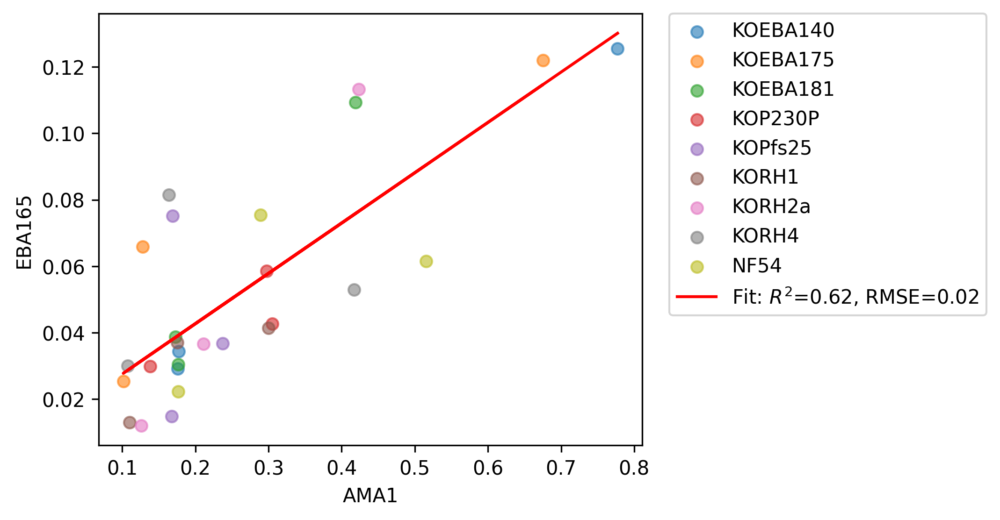

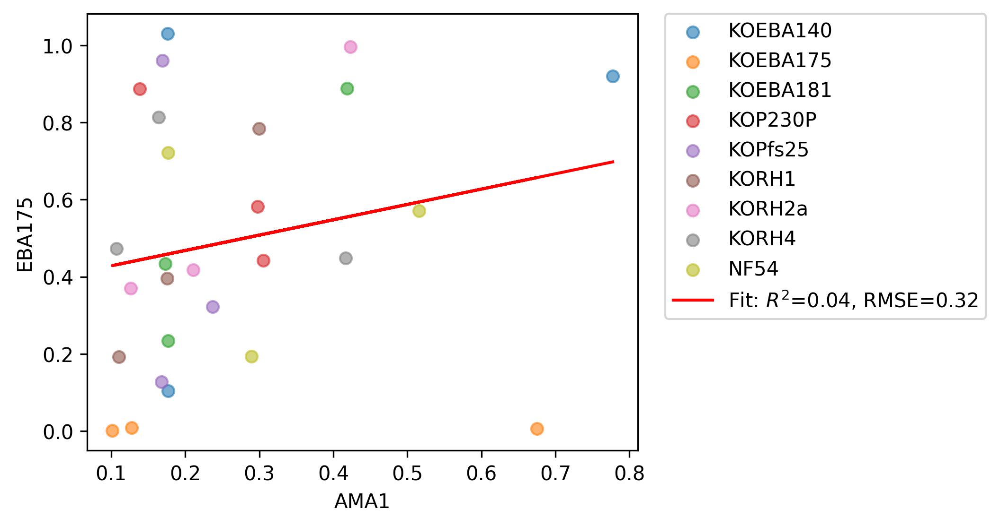

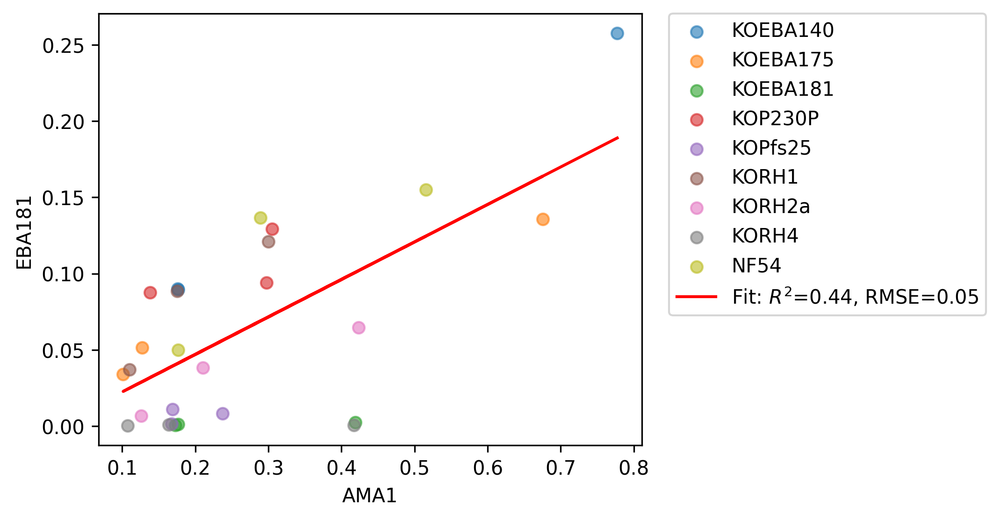

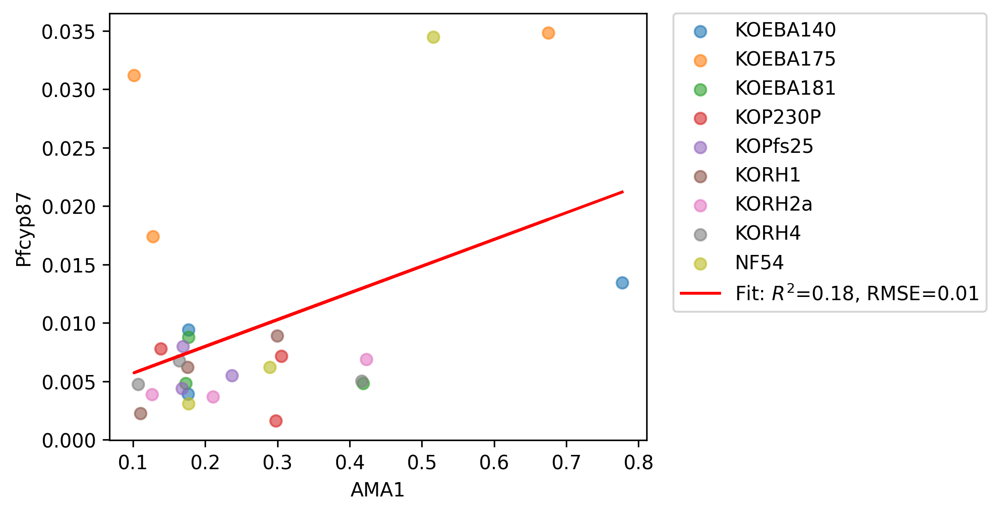

...

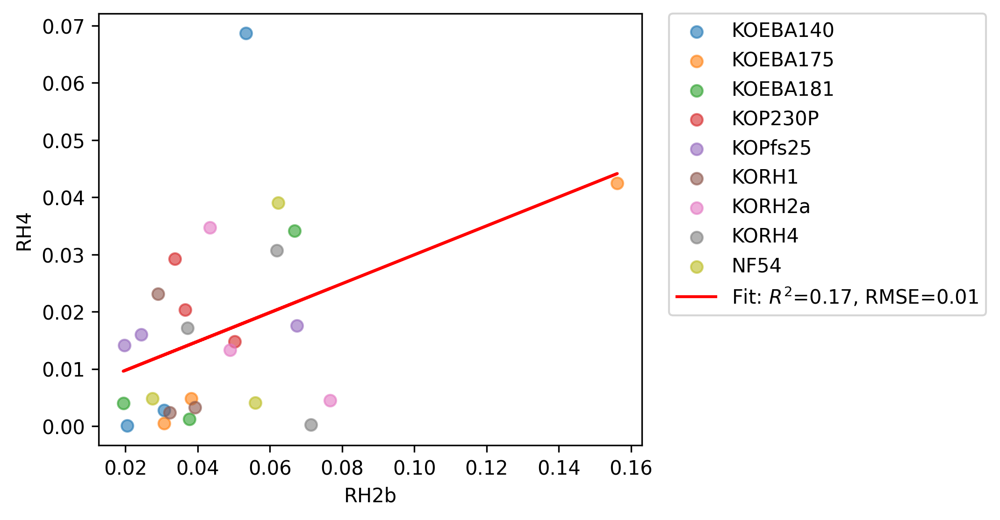

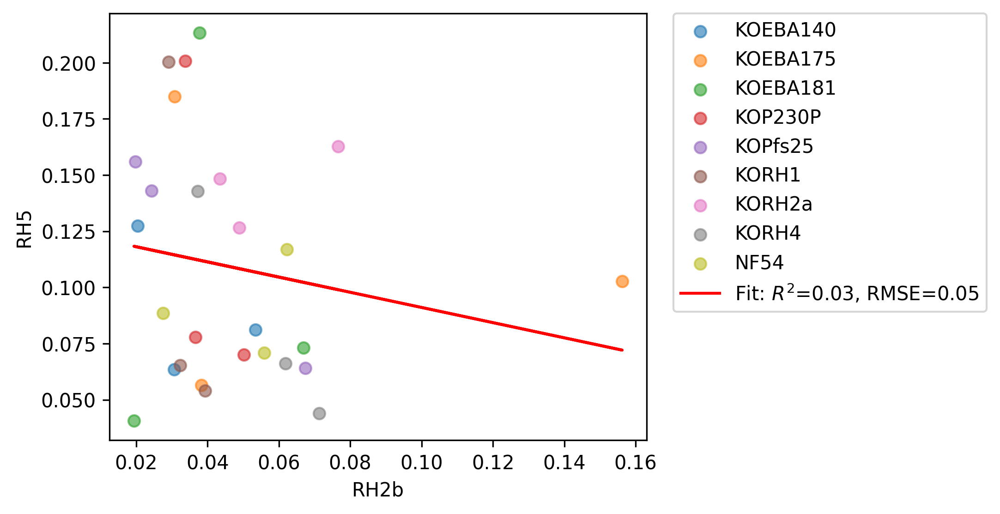

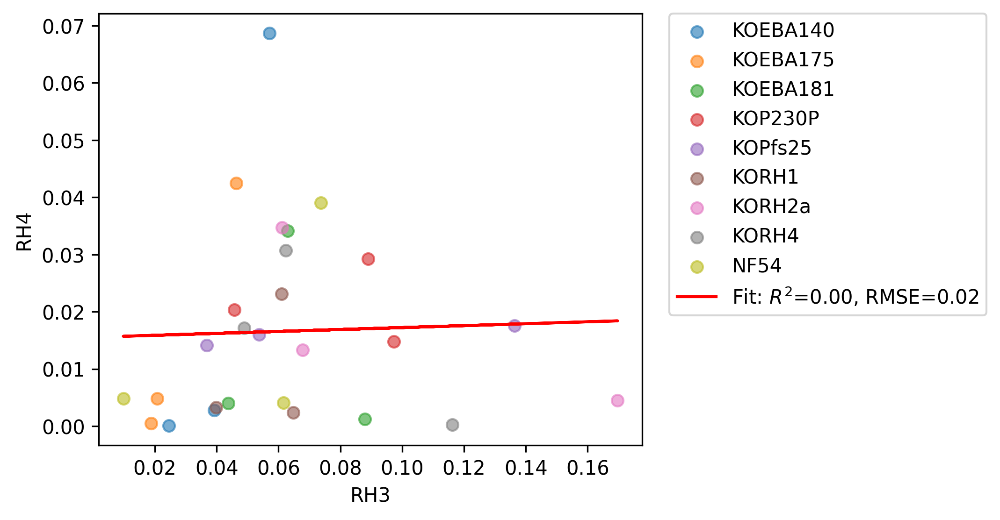

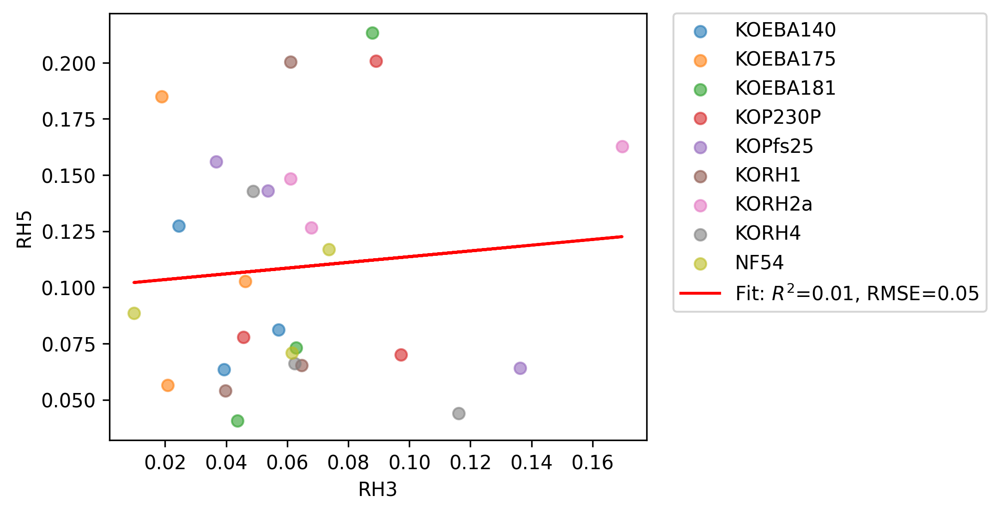

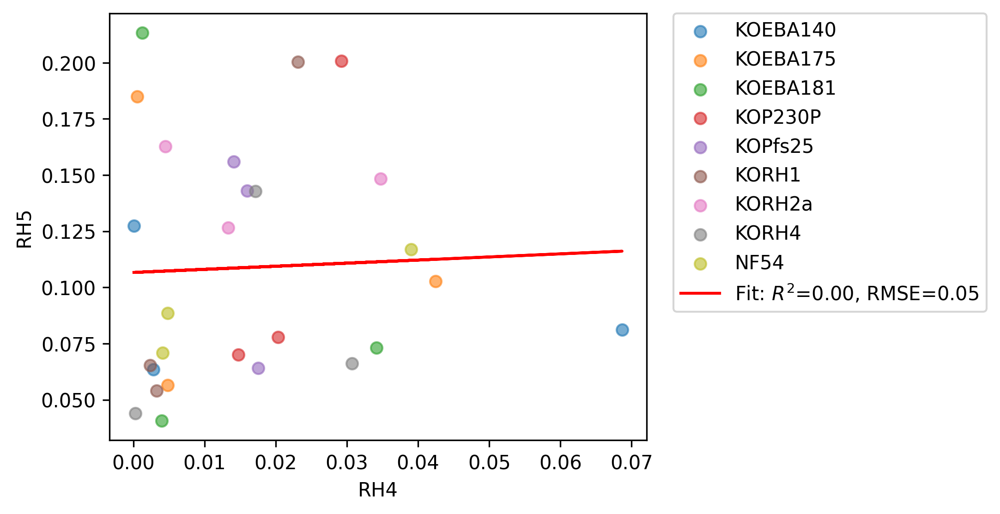

In [8]:
# Assume the columns you want to include are all except the first one which might be an identifier
features = reshaped_df.columns[2:]

dfq = reshaped_df.query('line_sample != "KOPfs25_4"')
data = dfq[features]

# Fit UMAP
# reducer = umap.UMAP(random_state=42)
# embedding = reducer.fit_transform(data)

# plt.figure(figsize=(12, 8))  # Adjust figure size
# plt.scatter(embedding[:, 0], embedding[:, 1], s=5, alpha=0.6)  # Adjust size(s) and transparency(alpha) as needed

# # Annotate each point with its respective label
# for i in range(embedding.shape[0]):
#     plt.annotate(dfq.iloc[i,0],  # this gets the label (row name)
#                  (embedding[i, 0], embedding[i, 1]),
#                  textcoords="offset points",
#                  xytext=(0,3),  # distance from text to points (x,y)
#                  ha='center',
#                  fontsize=8,
#                  alpha=0.8)  # transparency of the labels

# plt.xlabel('UMAP1')
# plt.ylabel('UMAP2')
# plt.title('2D UMAP with Annotations')
# plt.show()

# all combinations of two features
import itertools
from sklearn.metrics import mean_squared_error, r2_score

combinatinos = list(itertools.combinations(features, 2))
print(len(combinatinos))
fits = []
for a,b in combinatinos:
    plt.figure(figsize=(5,4), dpi=300)  # Adjust figure size
    
    for line, dfg in dfq.groupby('line'):
        xs = dfg[a]
        ys = dfg[b]
        plt.scatter(xs, ys, label=line, alpha=0.6)  # Adjust size(s) and transparency(alpha) as needed

    xs = dfq[a]
    ys = dfq[b]

    # Linear regression fit
    p = np.polyfit(xs, ys, 1)  # 1 for linear regression
    line = np.polyval(p, xs)
    
    # Calculate metrics
    r2 = r2_score(ys, line)
    rmse = np.sqrt(mean_squared_error(ys, line))
    plt.plot(xs, line, color='red', label=f'Fit: $R^2$={r2:.2f}, RMSE={rmse:.2f}')
    fits.append((a,b,r2,rmse))

    plt.xlabel(a)
    plt.ylabel(b)
    #place legend outside plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

df_fits = pd.DataFrame(fits, columns=['gene A', 'gene B', 'r2', 'rmse'])
df_fits

In [ ]:
# PCA

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

features = reshaped_df.columns[1:13]
x = reshaped_df.loc[:, features].values

scaler = StandardScaler()
scaled_data = scaler.fit_transform(x)

print(features)

pca = PCA(n_components=3)  # Choose an appropriate value
pca_result = pca.fit_transform(scaled_data)

explained_variance = pca.explained_variance_ratio_
plt.bar(range(len(explained_variance)), explained_variance)
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Explained Variance by Principal Components')
plt.show()

plt.plot(range(1, len(explained_variance)+1), explained_variance.cumsum(), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Explained Variance')
plt.legend(loc='best')
plt.show()

components = pd.DataFrame(pca.components_, columns=features, index=[f'PC{i}' for i in range(1, pca.n_components_+1)])
print(components)

for i in range(3):
    for j in range(i+1,3):

        plt.scatter(pca_result[:, i], pca_result[:, j])
        plt.xlabel(f'Principal Component {i}')
        plt.ylabel(f'Principal Component {j}')
        plt.title('2D PCA Results')
        plt.legend(loc='best')
        plt.show()

In [ ]:
output_folder = get_output_folder(experiment='qPCR_all')
normalization_gene = 'Actin1'
normalization_line = 'NF54'

line_normalization_title = f'Expression fold change to {normalization_line} (normalised to {normalization_gene})'

dfq = df.query('gene != @normalization_gene and line != @normalization_line')

print(output_folder)

In [ ]:
log_barplot(
    df=dfq,
    x_key='gene',
    y_key=line_normalization_title,
    hue_key='line',
    colors=colors_dark,
    title=f"Gene Expression Fold Change to {normalization_line} ({normalization_gene})",
    ylabel=f"Fold Change (normalized to {normalization_gene})",
    output_folder=output_folder,
    figsize=(10,5),
)

In [ ]:
# plot each repeat
for sample, dfg in dfq.groupby('sample'):
    log_barplot(
        df=dfg,
        x_key='gene',
        y_key=line_normalization_title,
        hue_key='line',
        colors=colors_dark,
        title=f"Sample {sample}, Gene Expression Fold Change to {normalization_line} ({normalization_gene})",
        ylabel=f"Fold Change (normalized to {normalization_gene})",
        output_folder=output_folder,
        figsize=(10,5),
    )

# plot each line
list(df.columns)
for line, dfg in dfq.groupby('line'):
    log_barplot(
        df=dfg,
        x_key='gene',
        y_key=line_normalization_title,
        hue_key='line',
        colors=colors_dark,
        title=f"Line {line}, Gene Expression Fold Change to {normalization_line} ({normalization_gene})",
        ylabel=f"Fold Change (normalized to {normalization_gene})",
        output_folder=output_folder,
        figsize=(10,5),
    )